# Rendu: Projet 2 - Modèle de scoring
## SOMMAIRE
### I. Source des donnees
### II. Exploration des donnees
### III. Entrainement du modele
### IV. Evaluation de la performance du modèle
### V. Comment ameliorer les performance du model

## I. Source des donnees

Les données sont fournies par https://www.kaggle.com/c/home-credit-default-risk/overview}{Home, un service dédié à l'octroi de lignes de crédit (prêts) à la population non bancarisée. Prévoir si un client va ou non rembourser un prêt ou s'il a des difficultés est un besoin essentiel pour les entreprises, et Home Credit veut exploiter tout le potentiel de ses données pour voir quel type de modèles d'apprentissage automatique ou approfondi peut être développé pour l'aider dans cette tâche. Il existe dix (10) sources de données différentes :

##### Application_train/application_test
Les principales données sur l'entrainement et les tests avec des informations sur chaque demande de prêt au Crédit immobilier. Chaque prêt a sa propre ligne et est identifié par la caractéristique SK_ID_CURR qui est l'identifiant du prêt. Les données relatives à l'entrainement sont accompagnées de l'indicateur TARGET qui indique 0 : le prêt a été remboursé ou 1 : le prêt n'a pas été remboursé.

##### Bureau
Données concernant les crédits antérieurs du client auprès d'autres institutions financières. Chaque crédit antérieur a sa propre ligne dans le bureau, mais un prêt dans les données de demande peut avoir plusieurs crédits antérieurs.

##### Bureau_balance
Données mensuelles sur les crédits précédents en bureau. Chaque ligne correspond à un mois d'un crédit précédent, et un même crédit précédent peut comporter plusieurs lignes, une pour chaque mois de la durée du crédit.

##### Previous_application: 
Les demandes précédentes de prêts au crédit immobilier des clients qui ont des prêts dans les données de la demande. Chaque prêt actuel dans les données de demande peut avoir plusieurs prêts précédents. Chaque demande précédente comporte une ligne et est identifiée par la caractéristique SK_ID_PREV. 

##### POS_CASH_BALANCE: 
Données mensuelles sur les précédents points de vente ou prêts en espèces que les clients ont obtenus avec le Crédit immobilier. Chaque ligne correspond à un mois d'un prêt antérieur au point de vente ou en espèces, et un seul prêt antérieur peut comporter plusieurs lignes.

##### Credit_card_balance: 
Données mensuelles sur les cartes de crédit que les clients ont déjà eues avec Home Credit. Chaque ligne correspond à un mois de solde de carte de crédit, et une seule carte de crédit peut comporter plusieurs lignes.

##### Installments_payment: payment history for previous loans at Home Credit. 
Il y a une ligne pour chaque paiement effectué et une ligne pour chaque paiement manqué.

## II Exploration des donnees


### II.1 Import des librairies necessaires

In [46]:
# numpy et pandas pour la manipulation des donnees
import numpy as np
import pandas as pd 

# sklearn preprocessing pour le traitement des variables catégoriques
from sklearn.preprocessing import LabelEncoder

# Supprimer les avertissements 
import warnings
warnings.filterwarnings('ignore')

# matplotlib et seaborn pour l'elaboration des graphes
import matplotlib.pyplot as plt
import seaborn as sns
# Pour l'entrainement du modele et l'evaluation des performances
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
import scikitplot as skplt
from sklearn import metrics


### II.2 Lecture des donnees

In [2]:
# Donnees d'entrainement
df_train = pd.read_csv('/home/victoiredjimna/Documents/hoolley/home-credit-default-risk/application_train.csv')
print('Taille des donnees test: ', df_train.shape)
df_train.sample(5)

Taille des donnees test:  (307511, 122)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
279060,423296,1,Cash loans,M,Y,N,0,225000.0,1078200.0,31522.5,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,5.0
137269,259199,0,Cash loans,F,N,Y,0,450000.0,260640.0,25906.5,...,0,0,0,0,0.0,0.0,0.0,0.0,2.0,2.0
127913,248354,0,Cash loans,M,Y,N,0,225000.0,497520.0,31792.5,...,0,0,0,0,0.0,0.0,0.0,0.0,2.0,3.0
195973,327239,0,Cash loans,F,N,N,0,90000.0,254700.0,13068.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
229326,365615,0,Cash loans,F,N,Y,0,67500.0,239850.0,23494.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0


Apres lecture, nous remarquons que les donnees d'entrainement sont composees de 307 511 identifiants, de 121 variables et d'une etiquette qui represente le remboursement du prêt ou pas.

In [3]:
# Donnees de test
df_test = pd.read_csv('/home/victoiredjimna/Documents/hoolley/home-credit-default-risk/application_test.csv')
print('Testing data shape: ', df_test.shape)
df_test.head()

Testing data shape:  (48744, 121)


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


Apres lecture, nous remarquons que les donnees de test sont composees de 48 744 identifiants, de 121 variables.

### II.3 Examinons la distribution de l'etiquette

In [4]:
df_train['TARGET'].value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

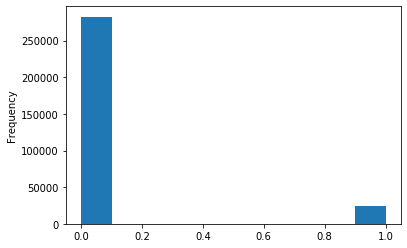

In [5]:
df_train['TARGET'].astype(int).plot.hist();

Nous observons que les donnees d'entrainement sont desequilibrees car nous avons beaucoup plus des prêts rembourses que non.

### II.4 Examinons les valeurs perdues
Ensuite, nous pouvons examiner le nombre et le pourcentage de valeurs manquantes dans chaque colonne. 

In [6]:
# Fonction de calcul des valeurs manquantes par colonne
def valeurs_manquantes_table(df):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Pourcentage des valeurs manquantes
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        
        # Faites un tableau avec les résultats
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Renommer les colonnes
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'valeurs manquantes', 1 : '% de valeur total'})
        
        # Trier le tableau par pourcentage de manquants en ordre décroissant
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% de valeur total', ascending=False).round(1)
        
        # afficher un resume des informations
        print ("Nos donnees d'entrainement ont " + str(df.shape[1]) + " colonnes.\n"      
            + str(mis_val_table_ren_columns.shape[0]) +
              " colonnes contiennent des valeurs manquantes.")
        
        # Retourner des donnees suivi des informations manquantes
        return mis_val_table_ren_columns

In [7]:
# Statistique des valeurs perdues
valeurs_manquantes= valeurs_manquantes_table(df_train)
valeurs_manquantes.head(5)

Nos donnees d'entrainement ont 122 colonnes.
67 colonnes contiennent des valeurs manquantes.


,valeurs manquantes,% de valeur total
COMMONAREA_MEDI,214865,69.9
COMMONAREA_AVG,214865,69.9
COMMONAREA_MODE,214865,69.9
NONLIVINGAPARTMENTS_MEDI,213514,69.4
NONLIVINGAPARTMENTS_MODE,213514,69.4


In [8]:
# Nombre de chaque types des colonnes
df_train.dtypes.value_counts()

float64    65
int64      41
object     16
dtype: int64

### II.5 Examinons le nombre d'entrées uniques dans chacune des colonnes d'objets (catégories).

In [9]:
# Number of unique classes in each object column
df_train.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

La plupart des variables catégorielles ont un nombre relativement faible d'entrées uniques. Nous devrons trouver un moyen de traiter ces variables catégoriques! 

#### Encodage des variables catégoriques
##### Codage des étiquettes et codage en une seule fois
pour toute variable catégorielle (`dtype == objet`) avec 2 catégories uniques, nous utiliserons un codage par étiquette, et pour toute variable catégorielle avec plus de 2 catégories uniques, nous utiliserons un codage en une seule fois. 

Pour l'encodage des étiquettes, nous utilisons la fonction Scikit-Learn `LabelEncoder` et pour l'encodage en une seule fois, la fonction pandas `get_dummies(df)`.

In [10]:
# Créer un objet encodeur d'étiquettes
le = LabelEncoder()
le_count = 0

# Itérer à travers les colonnes
for col in df_train:
    if df_train[col].dtype == 'object':
        
        # Si 2 ou moins de catégories uniques
        if len(list(df_train[col].unique())) <= 2:
            # Entrainement sur les données d'entrainement
            le.fit(df_train[col])
            # Transformer les données relatives à l'entrainement et aux tests
            df_train[col] = le.transform(df_train[col])
            df_test[col] = le.transform(df_test[col])
            
            # Gardez une trace du nombre de colonnes encodées
            le_count += 1
            
print('%d colonnes ont été encodées avec une étiquette.' % le_count)

3 colonnes ont été encodées avec une étiquette.


In [11]:
# codage en une seule fois des variables catégoriques
df_train = pd.get_dummies(df_train)
df_test = pd.get_dummies(df_test)

print('Training Features shape: ', df_train.shape)
print('Testing Features shape: ', df_test.shape)

Training Features shape:  (307511, 243)
Testing Features shape:  (48744, 239)


### II.6 Anomalies

Les chiffres de la colonne "DAYS_BIRTH" sont négatifs car ils sont enregistrés par rapport à la demande de prêt en cours. Pour voir ces statistiques en années, nous pouvons les multiplier par -1 et les diviser par le nombre de jours dans une année :

In [12]:
(df_train['DAYS_BIRTH'] / -365).describe()

count    307511.000000
mean         43.936973
std          11.956133
min          20.517808
25%          34.008219
50%          43.150685
75%          53.923288
max          69.120548
Name: DAYS_BIRTH, dtype: float64

Ces âges semblent raisonnables. Il n'y a pas de valeurs aberrantes pour l'âge, que ce soit dans la partie supérieure ou inférieure. Qu'en est-il des jours d'emploi ?

In [13]:
df_train['DAYS_EMPLOYED'].describe()


count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

Cela ne semble pas correct ! La valeur maximale (en plus d'être positive) est d'environ 10.000 ans.

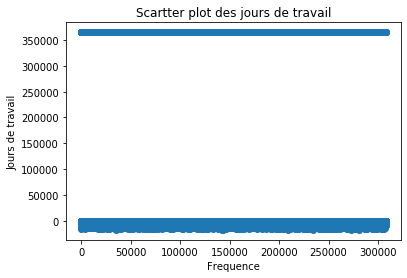

In [14]:
y=df_train['DAYS_EMPLOYED']
list(y)
x=[i for i in range(307511)]
plt.scatter(x, y)
plt.xlabel('Frequence')
plt.ylabel('Jours de travail')
plt.title('Scartter plot des jours de travail')
plt.show()


Par simple curiosité, sous-ensembleons les clients anormaux et voyons s'ils ont tendance à avoir un taux de défaillance plus élevé ou plus faible que le reste des clients.

In [15]:
anom = df_train[df_train['DAYS_EMPLOYED'] == 365243]
non_anom = df_train[df_train['DAYS_EMPLOYED'] != 365243]
print('Les non-anomalies font défaut sur %0.2f%% des prêts' % (100 * non_anom['TARGET'].mean()))
print('Les anomalies font défaut sur %0.2f%% des prêts' % (100 * anom['TARGET'].mean()))
print('Nous avons %d jours de travail anormals' % len(anom))

Les non-anomalies font défaut sur 8.66% des prêts
Les anomalies font défaut sur 5.40% des prêts
Nous avons 55374 jours de travail anormals


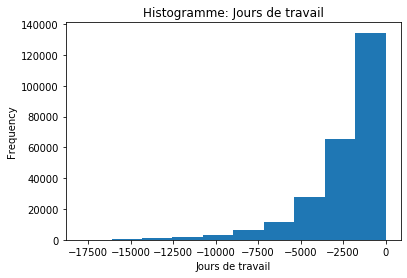

In [16]:
# Créer une colonne de drapeau anormale

df_train['DAYS_EMPLOYED_ANOM'] = df_train["DAYS_EMPLOYED"] == 365243

# Remplacer les valeurs anormales par nan
df_train['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

df_train['DAYS_EMPLOYED'].plot.hist(title = 'Histogramme: Jours de travail');
plt.xlabel('Jours de travail');

La distribution semble être beaucoup plus conforme à ce que l'on pourrait attendre, et nous avons également créé une nouvelle colonne pour indiquer au modèle que ces valeurs étaient à l'origine anormales (parce que nous devrons remplir les nans avec une certaine valeur, probablement la médiane de la colonne). Les autres colonnes avec les jours dans le cadre de données semblent correspondre à ce que nous attendons, sans aberrations évidentes.

Il est extrêmement important de noter que tout ce que nous faisons avec les données relatives à la formation doit également être fait avec les données relatives aux tests. Assurons-nous de créer la nouvelle colonne et de remplir la colonne existante avec np.nan dans les données de test.

In [17]:
df_test['DAYS_EMPLOYED_ANOM'] = df_test["DAYS_EMPLOYED"] == 365243
df_test["DAYS_EMPLOYED"].replace({365243: np.nan}, inplace = True)

print('On distingue %d anomalies dans les donnees de test sur %d entrees' % (df_test["DAYS_EMPLOYED_ANOM"].sum(), len(df_test)))

On distingue 9274 anomalies dans les donnees de test sur 48744 entrees


### Corrélations

* .00-.19 "très faible"
* .20-.39 "faible"
* .40-.59 "modéré"
* .60-.79 "fort"
* .80-1.0 "très fort"

In [18]:
# Trouver des corrélations avec l'objectif' et trier
correlations = df_train.corr()['TARGET'].sort_values()

# Afficher les correlations
print('Plus positives Correlations:\n', correlations.tail(15))
print('\nPlus Negatives Correlations:\n', correlations.head(15))

Plus positives Correlations:
 OCCUPATION_TYPE_Laborers                             0.043019
FLAG_DOCUMENT_3                                      0.044346
REG_CITY_NOT_LIVE_CITY                               0.044395
FLAG_EMP_PHONE                                       0.045982
NAME_EDUCATION_TYPE_Secondary / secondary special    0.049824
REG_CITY_NOT_WORK_CITY                               0.050994
DAYS_ID_PUBLISH                                      0.051457
CODE_GENDER_M                                        0.054713
DAYS_LAST_PHONE_CHANGE                               0.055218
NAME_INCOME_TYPE_Working                             0.057481
REGION_RATING_CLIENT                                 0.058899
REGION_RATING_CLIENT_W_CITY                          0.060893
DAYS_EMPLOYED                                        0.074958
DAYS_BIRTH                                           0.078239
TARGET                                               1.000000
Name: TARGET, dtype: float64

Plus Negat

Examinons quelques corrélations plus significatives : la corrélation la plus positive est celle de DAYS_BIRTH. (sauf pour TARGET car la corrélation d'une variable avec elle-même est toujours de 1 !) Si l'on regarde la documentation, DAYS_BIRTH est l'âge en jours du client au moment du prêt en jours négatifs (quelle que soit la raison !). La corrélation est positive, mais la valeur de cette caractéristique est en fait négative, ce qui signifie qu'à mesure que le client vieillit, il est moins susceptible de ne pas rembourser son prêt (c'est-à-dire l'objectif == 0). C'est un peu déroutant, alors nous prendrons la valeur absolue de la caractéristique et la corrélation sera négative.

## Selection des variables
Nous allons effectuer la matrice de correlation

In [19]:
corr = df_train.corr()
corr.style.background_gradient(cmap='coolwarm')

Das cette matrice, toutes les variables qui ont une correlation de plus de 80%, on selectionnera une et supprimera l'autre dans le but de rendre robuste notre model d'entrainement

## III Entrainement du modele
Nous utiliserons:
Les donnees test n'ayant pas d'objectif, on divisera les donnees d'entrainement en donnees test et donnees d'entrainement.

### Division des donnees

In [24]:
df_train.fillna(df_train.median(), inplace=True)
# Definition des variables
X = df_train.loc[:, df_train.columns != 'TARGET']
# Definition de la sortie
Y=df_train.TARGET
# On applique la division
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.25)

### Algoritme 

In [30]:
clf = GaussianNB()
clf.fit(X_train, Y_train)
Y_pred = clf.predict(X_test)
predicted_probas=clf.predict_proba(X_test)

### Precision

In [31]:
accuracy_score(Y_test, Y_pred)

0.9192096568589193

## IV Evaluation de la performance du modèle

In [33]:
cnf_matrix=confusion_matrix(Y_test, Y_pred)
cnf_matrix

array([[70667,     0],
       [ 6211,     0]])

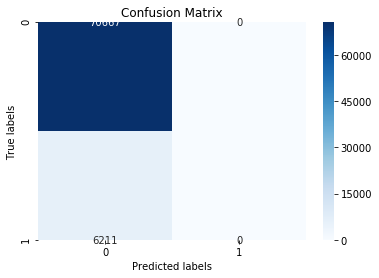

In [34]:
ax= plt.subplot()
sns.heatmap(cnf_matrix, annot=True,cmap=plt.cm.Blues, ax = ax, fmt='g'); #annot=True to annotate cells


ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['0', '1']); ax.yaxis.set_ticklabels(['0', '1']);

### Courbe Cumulative gain

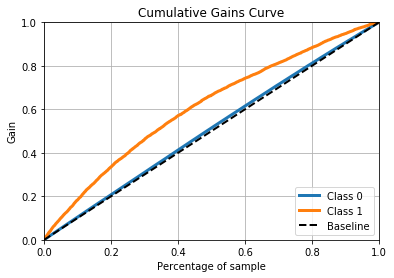

In [45]:
skplt.metrics.plot_cumulative_gain(Y_test, predicted_probas)
plt.show()

### Courbe Lift

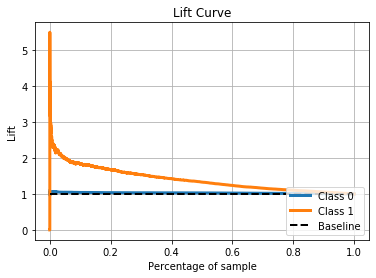

In [48]:
skplt.metrics.plot_lift_curve(Y_test, predicted_probas)
plt.show()

### Courbe ks statistic

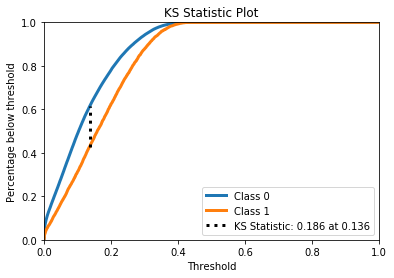

In [50]:
skplt.metrics.plot_ks_statistic(Y_test, predicted_probas)
plt.show()

### Courbe ROC
Cette courbe nous permet de voir les performances du modele. En effet, plus les courbes sont proches, plus le modelee est bon.

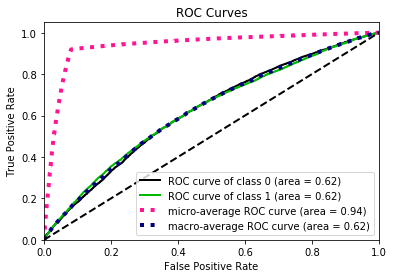

In [52]:
skplt.metrics.plot_roc(Y_test, predicted_probas)
plt.show()

### Métrique de performance AUC

In [43]:
fpr, tpr, thresholds = metrics.roc_curve(Y_test, Y_pred)
metrics.auc(fpr, tpr)

0.5

## V Comment ameliorer les performance du model?
* Utiliser 'GridSearch' pour avoir la bonne combinaison des parametres afin d'ontenir la meilleur precision
* Utiliser les connaissances du domaine bancaires pour mieux selectionner les variable afin de moins encombrer le model et avoir une meilleur performance.